# Health and Lifestyle Data Cluster Analysis

**Names**: Rishi Mulchandani, Andrew Sprenger, Ethan Handojo


## 1. Introduction

Our dataset contains health and lifestyle attributes including factors such as demographics, physical activity, and dietary habits. According to the Yale School of Public Health (2025), lifestyle choices such as alcohol and tobacco use, little exercise, and poor nutrition are highly correlated with cancer, obesity, and other chronic health conditions. Our motivation for learning more about existing clusters in this dataset is to help to explain possible relationships between these factors, as well as their effect on lifestyle or possible disease outcomes. Additionally, the Centers for Disease Control and Prevention (2022) state that public health officials often use health data to find ways of reducing potential risk factors. Our cluster analysis could provide these health officials with groupings of people with similar characteristics. They could then help these individuals identify how their lifestyle choices impact their overall health. Lastly, our cluster analysis can lead to changing unhealthy behaviors, as referenced to in an article by the American Psychological Association (2010).

Someone wanting to explore possible relationships between health factors and lifestyle choices would find multiple clustering results useful. A clustering where each cluster is well-separated would be useful because it can clearly distinguish health factors and lifestyle choices between groups. On the other hand, a fuzzy clustering would be useful because individuals could seek personalized recommendations based on their degree of membership to a certain cluster. A clustering where at least one clustering was a singleton outlier would be useful in suggesting individuals with underlying conditions or with lifestyle choices not represented in the dataset. Finally, a dendrogram which displays a nested cluster relationship would be useful in identifying details about specific characteristics and how they interact with each other.  

## 2. Dataset Discussion

There are 1000 rows in the dataframe originally before any data cleaning. We obtained this Health & Lifestyle Dataset from Kaggle, and this is the link: [Kaggle Health & Lifestyle Dataset](https://www.kaggle.com/datasets/mahdimashayekhi/health-and-lifestyle-dataset?resource=download). Instead of downloading this csv file, we leveraged kagglehub Python package to download this dataset from the KaggleHub repository - a third-party utility for easier access to Kaggle datasets. This is so that we do not have to keep reading in the file for ease of group collaboration. However, the initial csv was read in/downloaded on April 28th.


Each row represents an individual's health and lifestyle-related data such as physical activity, dietary habits, sleep patterns, mental well-being and medical history. How the dataset was collected is not described in the source. Additionally, the dataset is not fully inclusive of all possible observations relevant to health and lifestyle as it lacks important factors such as mental health indicators (stress, depression), detailed dietary habits, socioeconomic data (income, education), family medical history, and environmental influences. Including these could provide a more holistic and accurate understanding of an individual's health. Since the dataset lacks key health-related variables described above, any insights or cluster-based recommendations derived may be incomplete. As a result, any health officials should be cautious about making strong decisions based solely on these findings. They might use the results as a starting point, but should seek additional data before taking actions like designing interventions, targeting health programs, or making individualized recommendations.

We intend to use all variables except ID, BMI, and Blood Pressure to keep only the independent, useful, and well-formatted features. Dropping ID, BMI, and Blood_Pressure helps avoid redundancy, noise, and formatting issues that could negatively affect our clustering analysis.

In [ ]:
# imports
import pandas as pd
import os
from sklearn.neighbors import NearestNeighbors
!pip install kneed
from kneed import KneeLocator
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
!pip install kmodes
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import pairwise_distances
!pip install gower
import gower
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import adjusted_rand_score

In [ ]:
import kagglehub
# latest version download
path = kagglehub.dataset_download("mahdimashayekhi/health-and-lifestyle-dataset")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/health-and-lifestyle-dataset


In [ ]:
csv_file = os.path.join(path, 'health_activity_data.csv')
df = pd.read_csv(csv_file)
df.head()

,ID,Age,Gender,Height_cm,Weight_kg,BMI,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Blood_Pressure,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic,Heart_Disease
0,1,56,Male,164,81,30.72,5134,1796,8.6,102,137/72,8.1,No,7,No,No
1,2,69,Male,156,82,20.86,12803,1650,4.5,103,129/65,3.7,No,7,No,No
2,3,46,Female,158,65,30.93,16408,1756,4.3,74,127/68,3.2,Yes,0,No,No
3,4,32,Male,197,87,31.19,18420,2359,4.1,116,125/86,8.5,No,5,No,No
4,5,60,Male,157,63,29.37,17351,2556,5.1,111,100/64,8.5,Yes,8,No,No


In [ ]:
row_num = df.shape[0]
row_num

1000

## 3. Dataset Cleaning and Exploration

The Health & Lifestyle Dataset doesn’t have any missing values. Furthermore, there are no outliers in any of the pair plots. We used the KNN distance plot method to analyze the distance to each point's k-nearest neighbors in the high-dimensional feature space, accounting for relationships that may not be visible in simple 2D or 3D scatterplots. Across all three KNN plots (k=2, 3, and 4), there is a consistent upward curvature at the far right. The vertical dashed lines appear near the top end of the sorted distances, suggesting that a small number of points have unusually large distances to their neighbors. These points are additional outliers present in the dataset that were not identifiable using 2D scatter plots or visual inspection.

In the context of this research, outliers should not be dropped, as they could represent important or rare lifestyle/health situations. Instead, they should be preserved either as singleton clusters or treated separately to maintain their interpretive value. Though, including them in larger, distant clusters could misrepresent the data. Additionally, the presence of outliers could influence the choice of clustering algorithm down the line as some are better suited to handle them. In our dataset, however, we did not end up discovering any outliers.

We did discover some noise points based on the epsilon values suggested by the KNN distance plots, though it was very few. These noise points could indicate uncommon data patterns that do not conform well to the overall cluster structure, though they may still reflect various behavioral trends worth looking into further for analysis.

In [ ]:
df.columns

Index(['ID', 'Age', 'Gender', 'Height_cm', 'Weight_kg', 'BMI', 'Daily_Steps',
       'Calories_Intake', 'Hours_of_Sleep', 'Heart_Rate', 'Blood_Pressure',
       'Exercise_Hours_per_Week', 'Smoker', 'Alcohol_Consumption_per_Week',
       'Diabetic', 'Heart_Disease'],
      dtype='object')

In [ ]:
# drop id, bmi (since height and weight), blood pressurre
df = df.drop(columns = ['BMI', 'ID', 'Blood_Pressure'], axis = 1)
df.head()

,Age,Gender,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic,Heart_Disease
0,56,Male,164,81,5134,1796,8.6,102,8.1,No,7,No,No
1,69,Male,156,82,12803,1650,4.5,103,3.7,No,7,No,No
2,46,Female,158,65,16408,1756,4.3,74,3.2,Yes,0,No,No
3,32,Male,197,87,18420,2359,4.1,116,8.5,No,5,No,No
4,60,Male,157,63,17351,2556,5.1,111,8.5,Yes,8,No,No


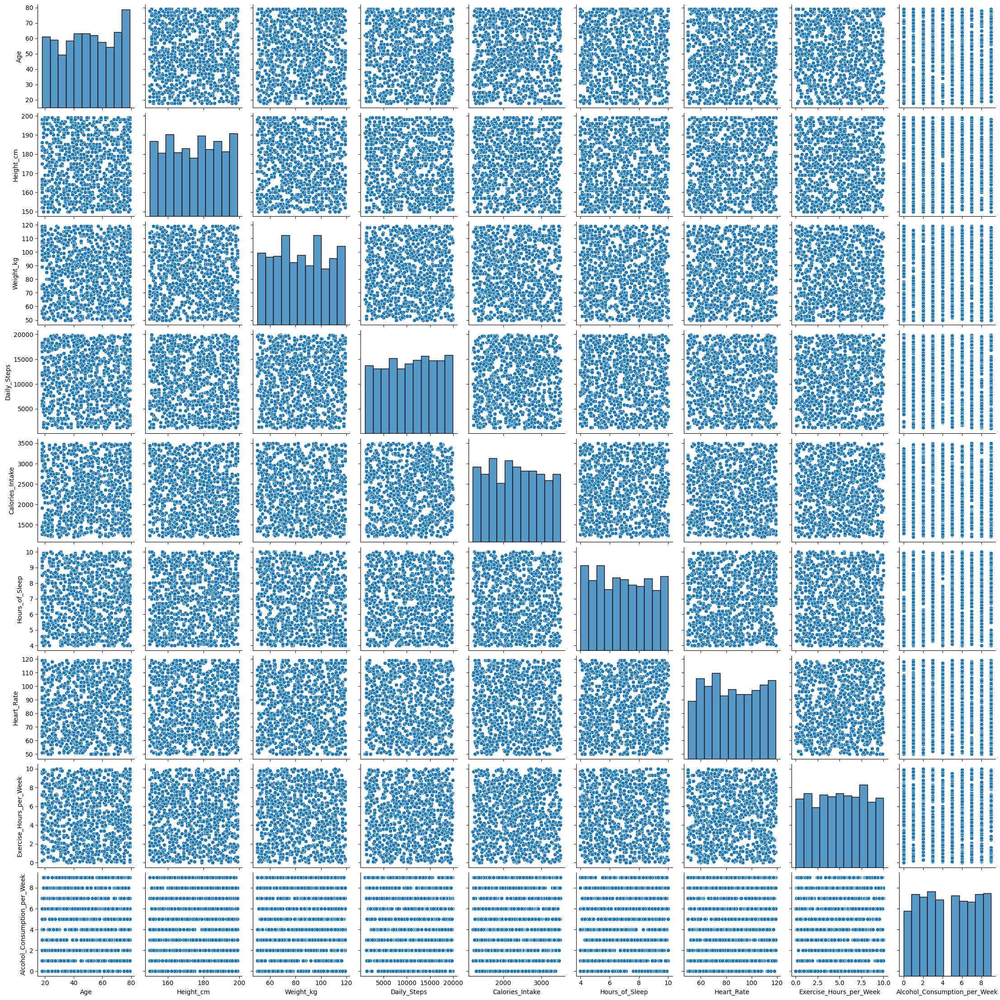

In [ ]:
import seaborn as sns
sns.pairplot(df)
# no outliers from looking at pairplot

In [ ]:
# verify columns
df.head(2)

,Age,Gender,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic,Heart_Disease
0,56,Male,164,81,5134,1796,8.6,102,8.1,No,7,No,No
1,69,Male,156,82,12803,1650,4.5,103,3.7,No,7,No,No


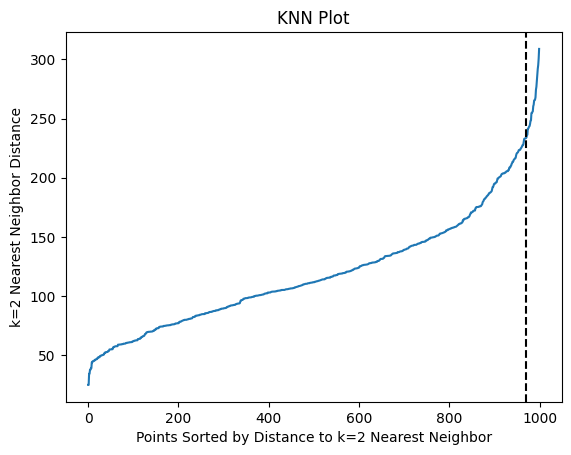

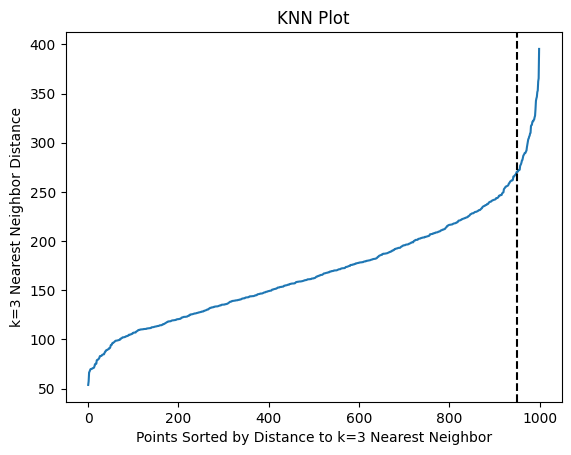

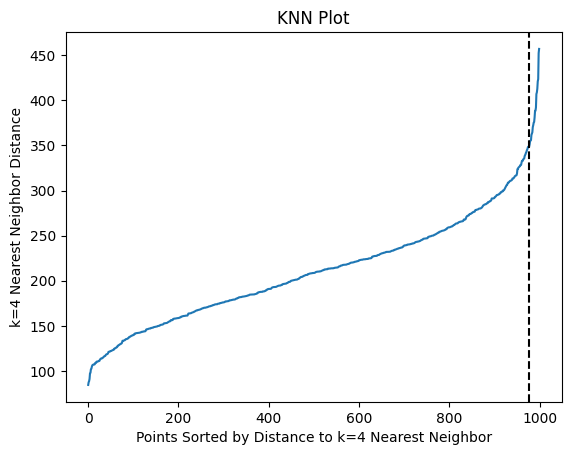

In [ ]:
for k in range(2, 5):
    # KNN fit
    nbrs = NearestNeighbors(n_neighbors=k).fit(df_num)
    distances, indices = nbrs.kneighbors(df_num)

    # k-th neighbor nearest distance sorted
    sorted_distances = np.sort(distances[:, k-1])

    # find elbow (used from kneed library for visualizing on graph)
    knee = KneeLocator(range(len(sorted_distances)), sorted_distances, curve='convex', direction='increasing')
    knee_point = knee.knee

    # plot
    plt.plot(sorted_distances)
    if knee_point:
        plt.axvline(x=knee_point, color='black', linestyle='--')
    else:
        print(f"k={k} No knee detected.")

    plt.xlabel(f'Points Sorted by Distance to k={k} Nearest Neighbor')
    plt.ylabel(f'k={k} Nearest Neighbor Distance')
    plt.title('KNN Plot')
    plt.show()

In [ ]:
# DBSCAN
X = df.select_dtypes(include=[np.number]).dropna()

# epsilon based on knn for k=4
dbscan = DBSCAN(eps=350, min_samples=5)
labels = dbscan.fit_predict(X)

# num of noise points
num_noise_points = np.sum(labels == -1)
print("Number of noise points as indicated by DBSCAN: ", num_noise_points)

Number of noise points as indicated by DBSCAN:  7


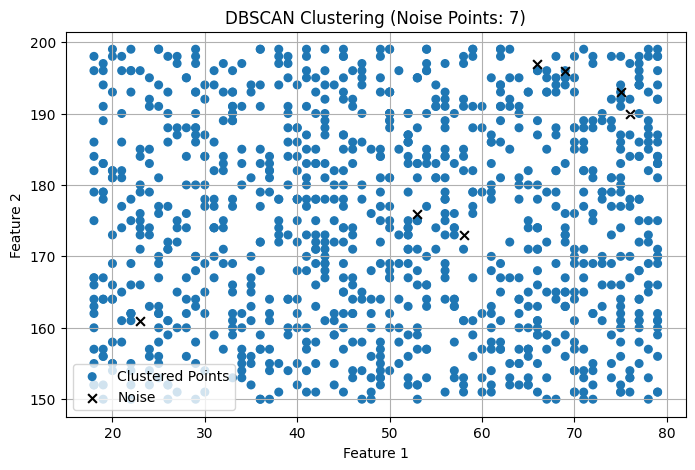

In [ ]:
X_array = X.to_numpy()

# plot clustered points vs noise

X_clustered = X_array[labels != -1]
X_noise = X_array[labels == -1]
labels_clustered = labels[labels != -1]

plt.figure(figsize=(8, 5))
plt.scatter(X_clustered[:, 0], X_clustered[:, 1], c=labels_clustered, cmap='tab10', s=30, label="Clustered Points")

plt.scatter(X_noise[:, 0], X_noise[:, 1], c='black', marker='x', s=40, label="Noise")

plt.title(f"DBSCAN Clustering (Noise Points: {np.sum(labels == -1)})")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.grid(True)
plt.show()

## 4. Basic Descriptive Analytics

We started by looking at the summary statistics for the numerical attributes. Many of these attributes have a large range of values, while alcohol consumption per week and exercise hours per week have the smallest. There is also a large range of standard deviation values. As for the categorical variables, there are 523 males and 477 females, 191 smokers and 809 non-smokers, 155 diabetics and 845 non-diabetics, and 93 people with heart disease and 907 people without heart disease. There does not appear to be any strong pairwise relationships between the variables from looking at the correlation matrix.

In [ ]:
## get numerical variables and cat. variables seperated
df_cat=df[['Gender','Smoker',
             'Diabetic','Heart_Disease']]
df_num=df.drop(['Gender', 'Smoker','Diabetic','Heart_Disease'],axis=1)
df_num

,Age,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Alcohol_Consumption_per_Week
0,56,164,81,5134,1796,8.6,102,8.1,7
1,69,156,82,12803,1650,4.5,103,3.7,7
2,46,158,65,16408,1756,4.3,74,3.2,0
3,32,197,87,18420,2359,4.1,116,8.5,5
4,60,157,63,17351,2556,5.1,111,8.5,8
...,...,...,...,...,...,...,...,...,...
995,18,179,116,10095,2667,4.6,79,6.3,5
996,35,170,114,11361,2351,7.2,54,2.9,3
997,49,169,85,9531,2416,4.5,80,7.6,4
998,64,155,74,5270,2080,5.8,101,5.4,4


In [ ]:
#4) descirptive analytics for numerical and categorical
df_num.describe()

,Age,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Alcohol_Consumption_per_Week
count,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,49.857000,174.74500,84.35200,10717.034000,2327.117000,6.90990,84.710000,5.045500,4.573000
std,18.114267,14.54192,20.06596,5444.707891,657.847942,1.77964,20.130155,2.847801,2.852509
min,18.000000,150.00000,50.00000,1016.000000,1201.000000,4.00000,50.000000,0.000000,0.000000
25%,35.000000,162.00000,68.00000,6028.250000,1745.750000,5.30000,67.000000,2.675000,2.000000
50%,50.000000,175.00000,84.00000,10898.000000,2328.500000,6.90000,84.000000,5.100000,5.000000
75%,66.000000,187.00000,101.00000,15253.250000,2880.000000,8.40000,103.000000,7.600000,7.000000
max,79.000000,199.00000,119.00000,19931.000000,3498.000000,10.00000,119.000000,10.000000,9.000000


In [ ]:
#4)descirptive analytics for  categorical
for col in ['Gender', 'Smoker', 'Diabetic', 'Heart_Disease']:
    print(f"\ncounts for {col}:")
    print(df_cat[col].value_counts())


counts for Gender:
Gender
Male      523
Female    477
Name: count, dtype: int64

counts for Smoker:
Smoker
No     809
Yes    191
Name: count, dtype: int64

counts for Diabetic:
Diabetic
No     845
Yes    155
Name: count, dtype: int64

counts for Heart_Disease:
Heart_Disease
No     907
Yes     93
Name: count, dtype: int64


In [ ]:
#)4 pairwise relationships- categorical??
df_num.corr()

,Age,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Alcohol_Consumption_per_Week
Age,1.000000,0.011398,-0.007586,-0.041595,0.015113,0.002246,0.029257,0.023398,-0.074179
Height_cm,0.011398,1.000000,-0.050377,-0.047623,-0.024313,0.065942,0.006976,0.024524,0.043488
Weight_kg,-0.007586,-0.050377,1.000000,-0.006106,-0.049735,-0.070725,-0.005472,-0.019767,-0.017448
Daily_Steps,-0.041595,-0.047623,-0.006106,1.000000,0.015434,0.007407,-0.001054,0.029070,-0.000152
Calories_Intake,0.015113,-0.024313,-0.049735,0.015434,1.000000,0.025054,-0.029669,-0.037324,-0.021075
Hours_of_Sleep,0.002246,0.065942,-0.070725,0.007407,0.025054,1.000000,0.072268,0.006634,0.043130
Heart_Rate,0.029257,0.006976,-0.005472,-0.001054,-0.029669,0.072268,1.000000,0.020997,-0.005924
Exercise_Hours_per_Week,0.023398,0.024524,-0.019767,0.029070,-0.037324,0.006634,0.020997,1.000000,0.020533
Alcohol_Consumption_per_Week,-0.074179,0.043488,-0.017448,-0.000152,-0.021075,0.043130,-0.005924,0.020533,1.000000


In [ ]:
# verify
df.head(2)

,Age,Gender,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic,Heart_Disease
0,56,Male,164,81,5134,1796,8.6,102,8.1,No,7,No,No
1,69,Male,156,82,12803,1650,4.5,103,3.7,No,7,No,No


## 5. Scaling Decisions

Because there is such a large range of raw numerical values, we decided to scale the dataset. However, we first dropped the class labels and changed the rest of the categorical values into binary values. We decided on this in order to make our dataset completely numerical (at least at the moment).

In [ ]:
##5) scaling- first drop class labels, change categorical into binary
X=df.copy()
X=X.drop(['Heart_Disease'],axis=1)
X.loc[:, ['Smoker', 'Diabetic']] = X[['Smoker', 'Diabetic',]].replace({'Yes': 1, 'No': 0})
X.loc[:, ['Gender']] = X[['Gender']].replace({'Male': 1, 'Female': 0})
X

<ipython-input-95-0e68e3b0adf6>:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X.loc[:, ['Smoker', 'Diabetic']] = X[['Smoker', 'Diabetic',]].replace({'Yes': 1, 'No': 0})
<ipython-input-95-0e68e3b0adf6>:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X.loc[:, ['Gender']] = X[['Gender']].replace({'Male': 1, 'Female': 0})


,Age,Gender,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic
0,56,1,164,81,5134,1796,8.6,102,8.1,0,7,0
1,69,1,156,82,12803,1650,4.5,103,3.7,0,7,0
2,46,0,158,65,16408,1756,4.3,74,3.2,1,0,0
3,32,1,197,87,18420,2359,4.1,116,8.5,0,5,0
4,60,1,157,63,17351,2556,5.1,111,8.5,1,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...
995,18,1,179,116,10095,2667,4.6,79,6.3,0,5,0
996,35,0,170,114,11361,2351,7.2,54,2.9,0,3,0
997,49,0,169,85,9531,2416,4.5,80,7.6,0,4,0
998,64,1,155,74,5270,2080,5.8,101,5.4,0,4,0


In [ ]:
##5) scaling
scaled_array=StandardScaler().fit_transform(X)
dfscaled=pd.DataFrame(scaled_array, columns=X.columns)
dfscaled

,Age,Gender,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Smoker,Alcohol_Consumption_per_Week,Diabetic
0,0.339295,0.955011,-0.739268,-0.167133,-1.025919,-0.807759,0.950162,0.859340,1.073119,-0.485895,0.851256,-0.42829
1,1.057320,0.955011,-1.289677,-0.117272,0.383310,-1.029806,-1.354828,0.909042,-0.472706,-0.485895,0.851256,-0.42829
2,-0.213033,-1.047108,-1.152075,-0.964902,1.045752,-0.868594,-1.467266,-0.532304,-0.648368,2.058058,-1.603952,-0.42829
3,-0.986291,0.955011,1.531169,0.132031,1.415470,0.048490,-1.579705,1.555162,1.213648,-0.485895,0.149768,-0.42829
4,0.560226,0.955011,-1.220876,-1.064623,1.219034,0.348101,-1.017512,1.306654,1.213648,2.058058,1.202000,-0.42829
...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.759549,0.955011,0.292749,1.577988,-0.114303,0.516917,-1.298608,-0.283796,0.440736,-0.485895,0.149768,-0.42829
996,-0.820593,-1.047108,-0.326461,1.478266,0.118333,0.036323,0.163092,-1.526335,-0.753765,-0.485895,-0.551720,-0.42829
997,-0.047334,-1.047108,-0.395262,0.032310,-0.217941,0.135179,-1.354828,-0.234094,0.897457,-0.485895,-0.200976,-0.42829
998,0.781156,0.955011,-1.358478,-0.516157,-1.000928,-0.375833,-0.623977,0.809639,0.124544,-0.485895,-0.200976,-0.42829


## 6. Clusterability and Clustering Structure

By looking at t-SNE plots, we found that this dataset is clusterable. We came to this conclusion because we saw a clustering structure across multiple random states and perplexity values. There are approximately four underlying inherent clusters in this data. The shapes of these clusters are slightly ellipsoidal, but they are generally spherical. The clusters are not balanced in size. Two of them are slightly bigger than the other two. These two bigger clusters are not as well separated as the smaller two, providing evidence of a potential main cluster with two subclusters. There does appear to be some association between the attributes and the clustering structure suggested by the t-SNE plots. It appears that the larger two clusters are composed of observations with higher values of the numerical variables. However, this could also be due to the fact that those clusters contain more observations overall. Most of the smokers are in their own cluster, with a few in the other small cluster. Those who are diabetics are also in their own small cluster. Gender appears to be strongly separated across clusters, with some clusters dominated by males and others by females and the other two with a clear split within the cluster (potentially suggesting nested cluster relationships). This suggests that gender may be a key attribute of the underlying clustering structure, rather than being evenly distributed. Those with heart disease appear to have a couple observations in each cluster. Despite these results, there are four original dataset properties that the t-SNE plots cannot reveal. They cannot tell us the distance between clusters, the centroids or other summary statistics, sparsity, or the existence of noise or outliers in the original dataset.

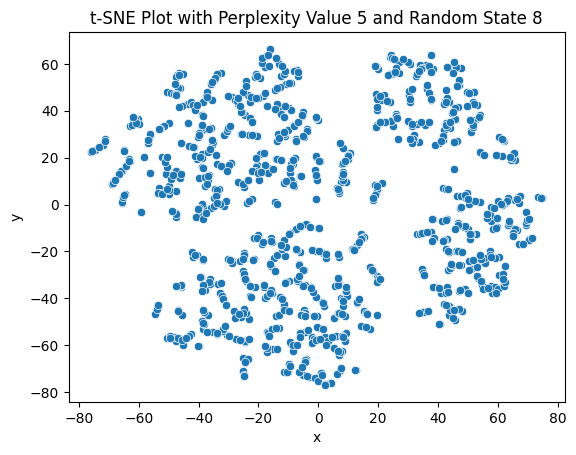

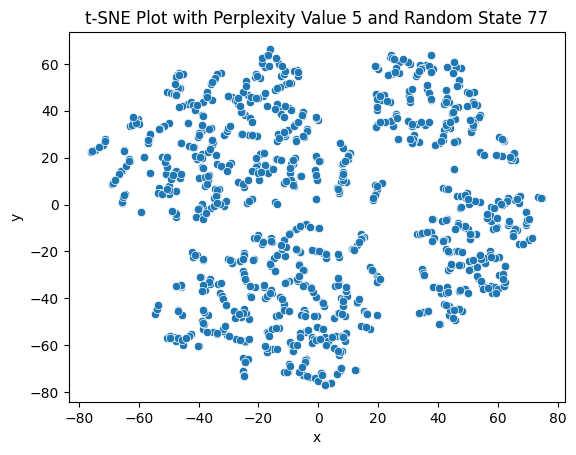

--------------------------------------------


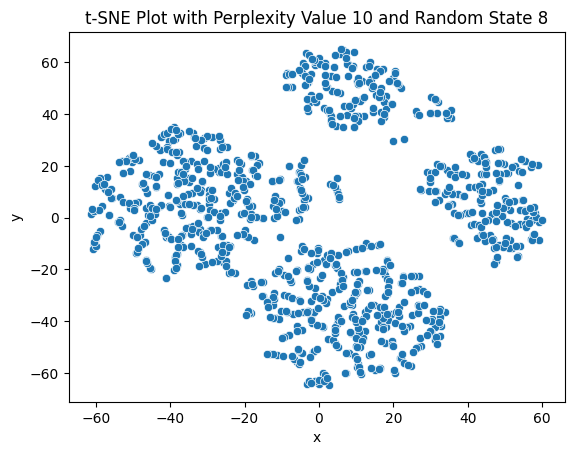

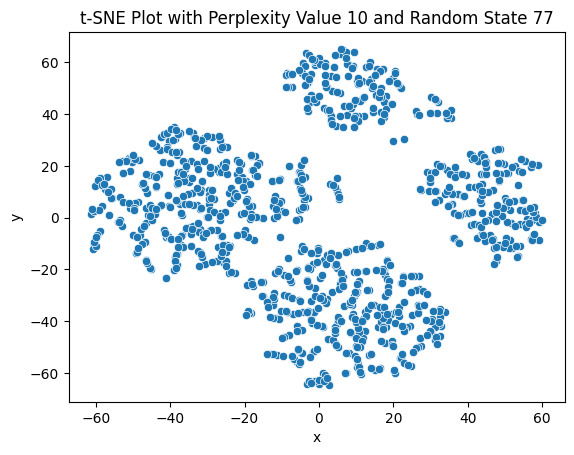

--------------------------------------------


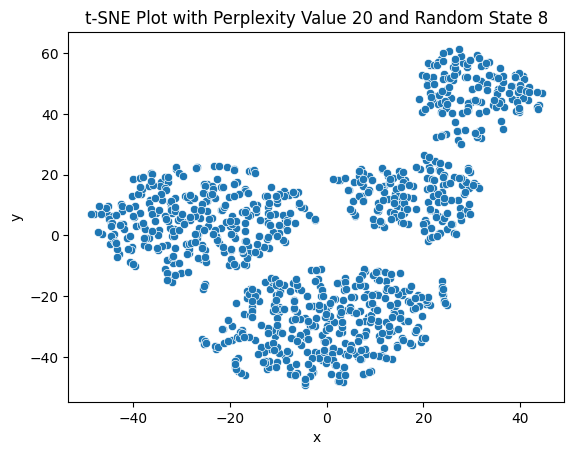

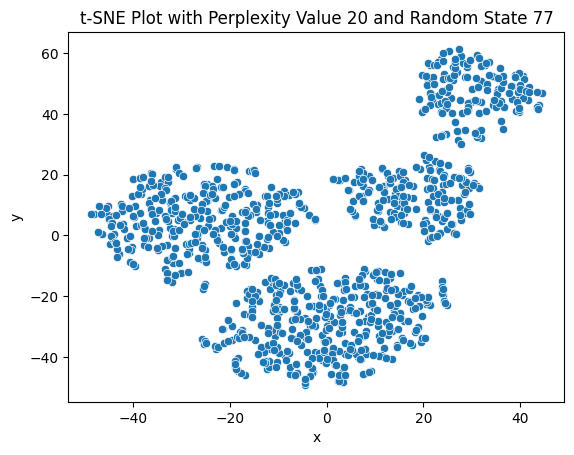

--------------------------------------------


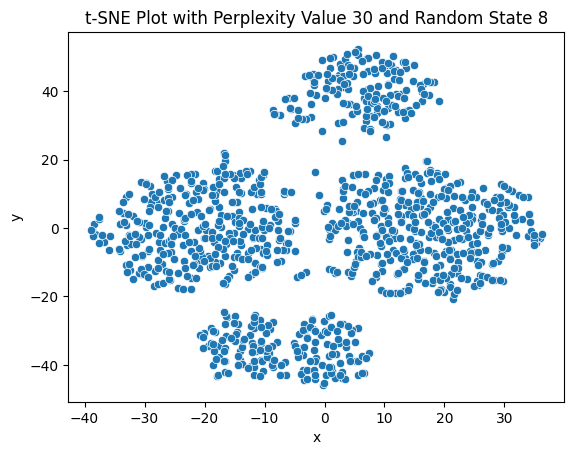

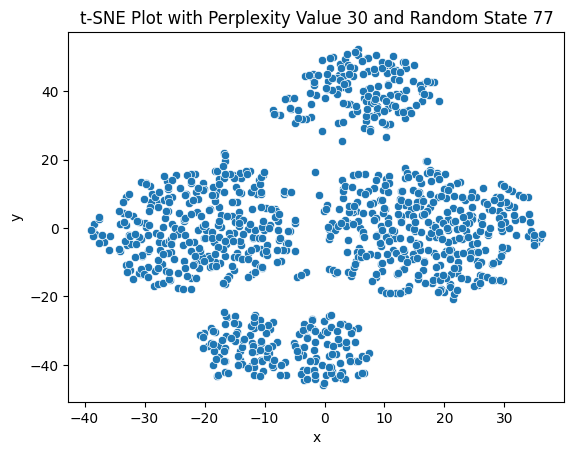

--------------------------------------------


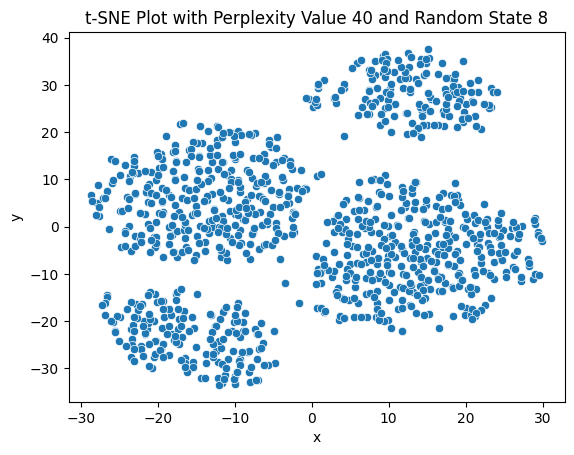

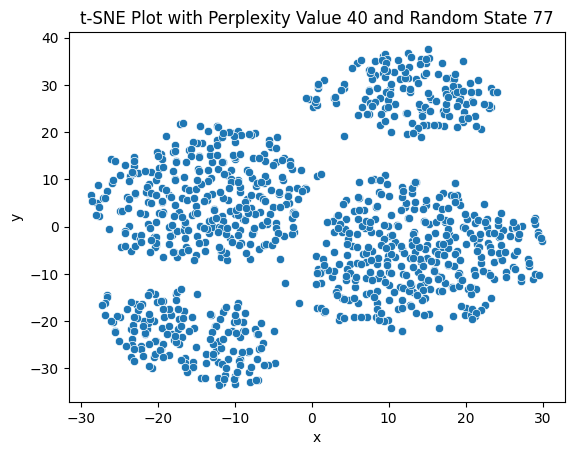

--------------------------------------------


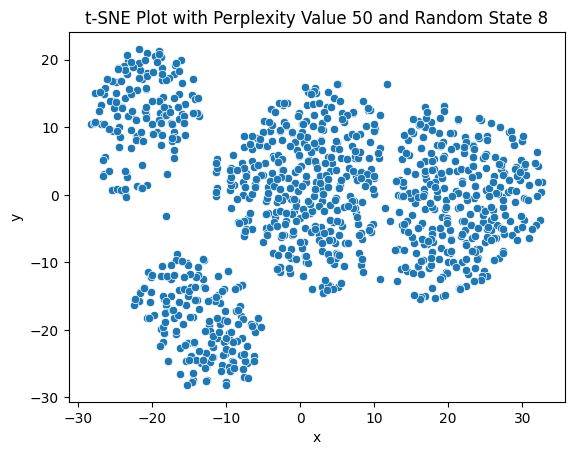

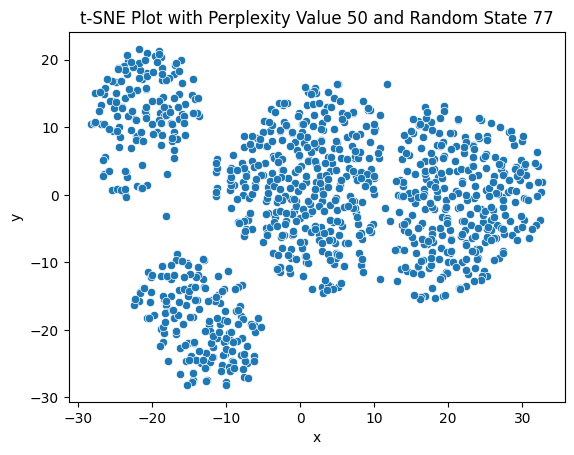

--------------------------------------------


In [ ]:
##6) clustering
##tsne
from sklearn.manifold import TSNE
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [8,77]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(dfscaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x', 'y'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x',y='y', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

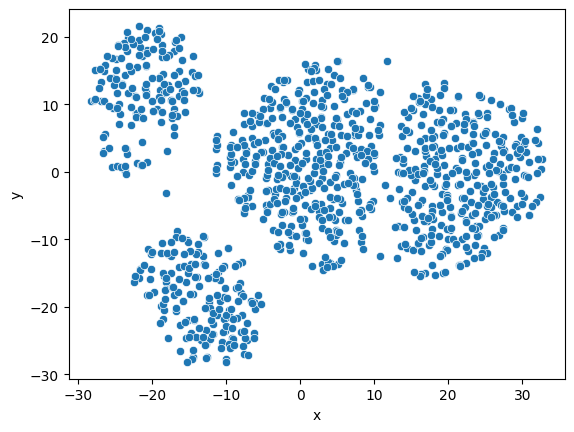

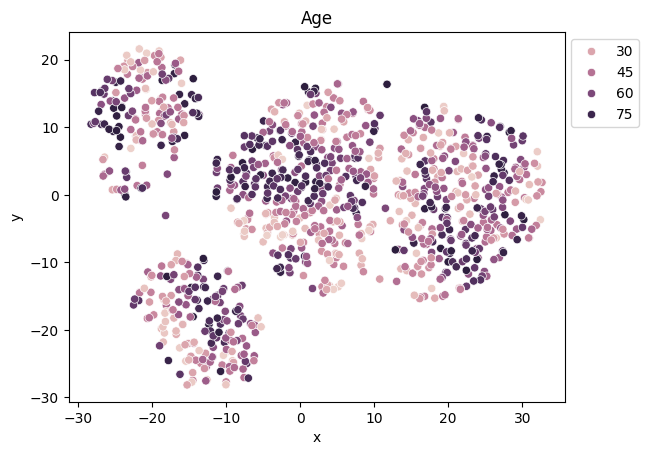

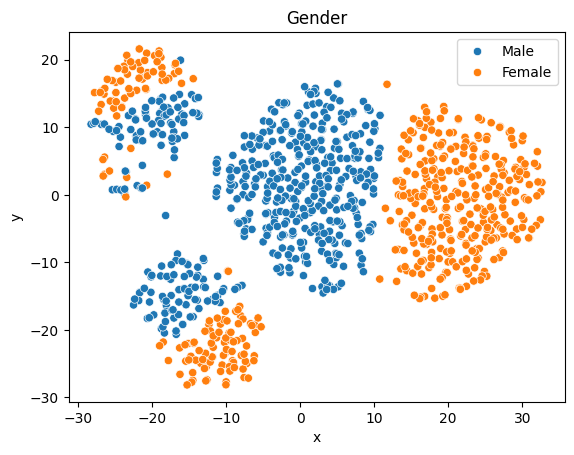

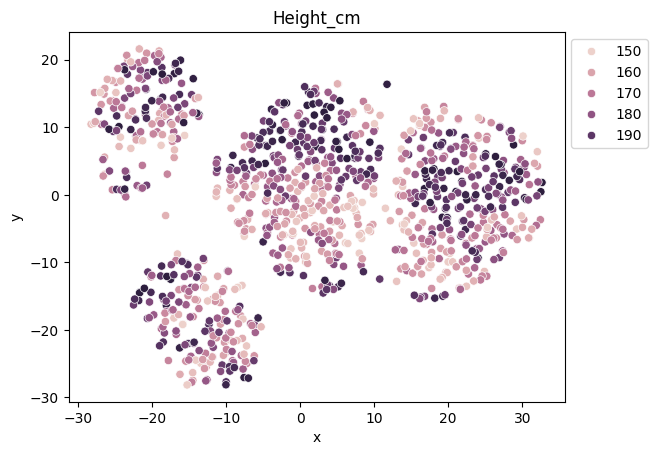

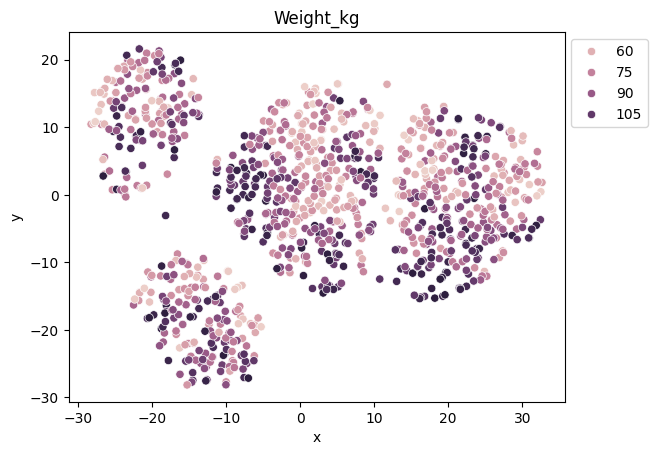

...

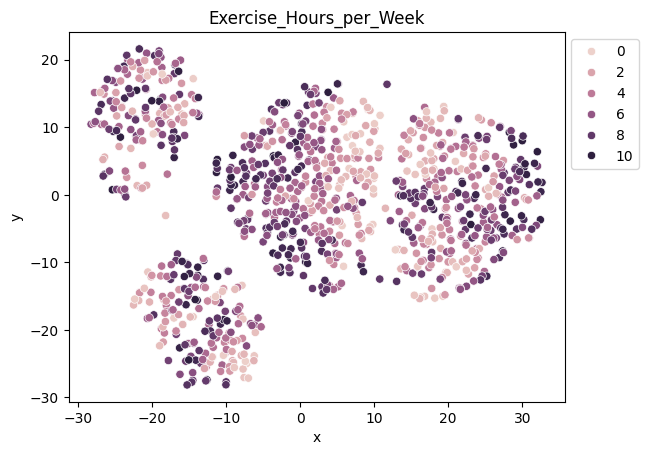

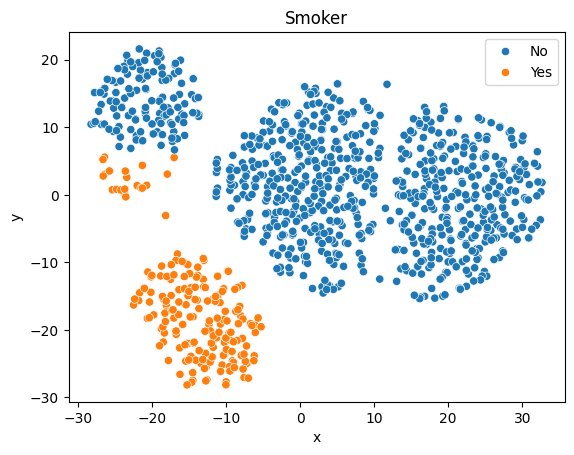

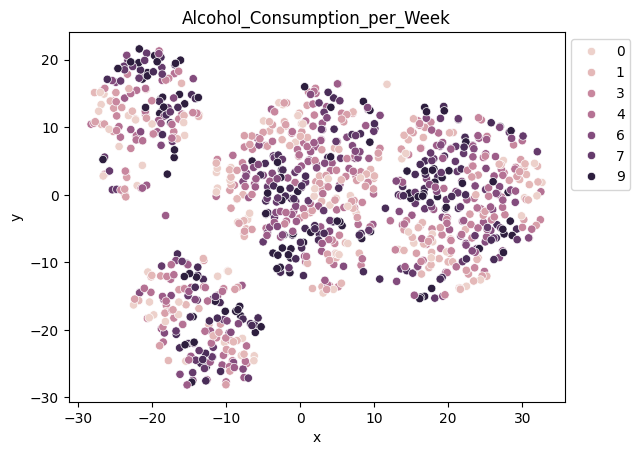

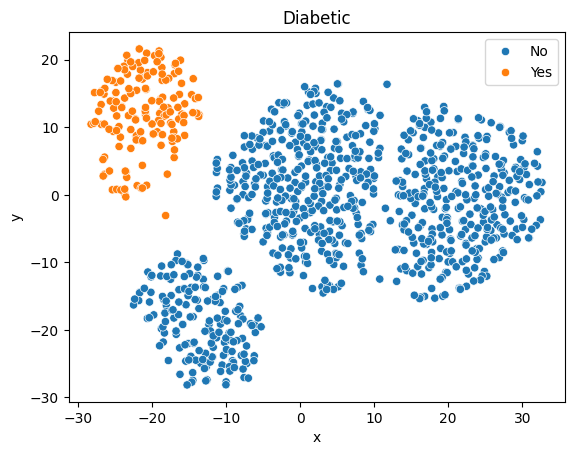

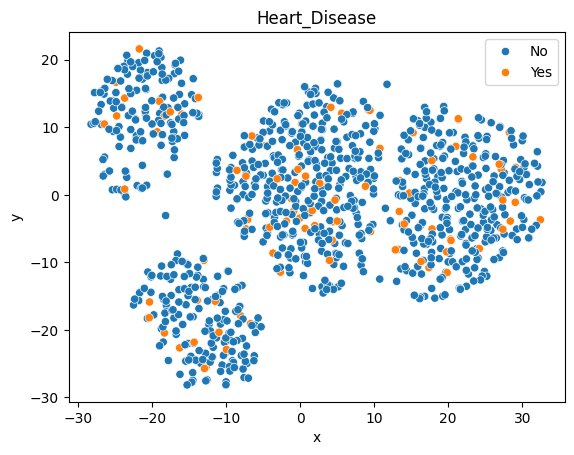

In [ ]:
##6) clustering- picking one tsne plot
tsne = TSNE(n_components=2, perplexity=50, random_state=77)
data_tsne = tsne.fit_transform(dfscaled)
df_tsne = pd.DataFrame(data_tsne, columns=['x', 'y'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x',y='y', data=df_combo)
plt.show()

## with attributes
for col in df_combo.columns[0:13]:
    sns.scatterplot(x='x', y='y', hue=col, data=df_combo)
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

## 7. Clustering Algorithm Selection Motivation

**KMeans (Algorithm #1)**

*   We chose KMeans as the first clustering algorithm because the research goal was to explore natural groupings in high-dimensional data, and the t-SNE plot suggested four well-separated, similarly sized clusters – properties well-suited for KMeans. Additionally, it is computationally efficient and scales well with large datasets, provides hard cluster assignments, and is easy to interpret. Despite the low silhouette score (0.081), the visual structure made KMeans a reasonable starting point and provides a strong baseline for comparison with more complex methods and algorithms
*   Additionally, we do believe there are benefits to returning a fuzzy clustering of the dataset. While KMeans forces hard assignments, a fuzzy clustering approach like Gaussian Mixture Models (GMM) would allow each point to belong to multiple clusters with probabilities. This could be especially useful given the low silhouette score and cluster overlap observed in the t-SNE visualization. For our research motivation, uncovering natural groupings for further analysis, fuzzy membership scores could help identify uncertain data points, provide confidence levels, and improve interpretability in the future ultimately.
*   Hierarchical clustering may also provide valuable insight. Given the possibility of nested structure or subclusters within larger groups, hierarchical clustering would allow us to explore this nested structure of the data. This could support our research goal by enabling the identification of both broad clusters and more granular subclusters. Additionally, the dendrogram output could help visually see the number of clusters and enhance interpretability in terms of its complexity.


**K-Prototypes (Algorithm #2)**

*   We chose K-Prototypes as the second clustering algorithm because our dataset contains a mix of numerical and categorical variables, and K-Prototypes is able to easily extend from K-Means to handle mixed data types by using squared Euclidean distance for continuous numerical features and handling categorical ones easily. This similarly fits our research goal of discovering inherent groupings across feature types without forcing us to discard or one-hot-encode categories, especially for a dataset like this where categorical variables could be extremely important. Similar to K-Means, the algorithm is efficient and can handle analysis even with large datasets. The algorithm meets the ideal properties for clustering as the analysis showed that the clusters were relatively spherical and similarly sized. We had an estimated number of clusters beforehand and were able to apply it accordingly to the dataset.
*   A fuzzy K-Prototypes method could offer useful additional information for our analysis. With membership values, it can provide a really clear image as to how perhaps the intersection of categorical boundaries and numerical variation impact the clustering (specifically how important various features may be). Fuzzy membership scores would also allow us to identify potentially confusing and conflicting observations (in terms of something like demographics for example) and provide these numerical levels for each assignment. These soft assignments could improve results in the context of medical uncertainty by weighing risk and being a good metric for medical professionals to use as well in risk assessment/diagnosis.
*   Hierarchical mixed-mode clustering could be useful for our analysis. Using a hierarchical algorithm with Gower distance (for mixed data types since we are dealing with categorical variables as well), will produce a dendrogram revealing nested cluster structures - with broader and more overarching higher-level segments and smaller, more specific sub clusters within. This nested tree view will let us easily visually identify and inspect where categorical splits coincide with numerical changes/values, and help us pick the levels for clustering. This is especially useful since it may even allow us to identify and uncover more in-depth patterns that a flat K-Prototype might miss.

## 8. Clustering Algorithm #1 (K-Means)



We selected KMeans with n_clusters=4 based on two methods: the elbow method and visual inspection of the t-SNE plot. The elbow method showed a noticeable bend at k=4, suggesting diminishing returns beyond that point. The t-SNE visualization also clearly showed four dense, well-separated blobs, confirming that four clusters is a reasonable choice. These two methods aligned, providing strong justification for selecting k=4.

The KMeans clustering result was visualized using t-SNE with cluster labels color-coded. While the t-SNE plot showed distinct and visually meaningful clusters, the silhouette score was low (0.081), indicating weak overall cohesion and separation. This discrepancy suggests that while t-SNE creates good visual separation, the underlying cluster structure may be less well-defined in the original feature space.

Cluster distances were evaluated using a cluster-sorted similarity matrix. Results showed four distinct diagonal blocks, indicating that samples within each cluster tend to be similar to one another. However, considerable noise and inter-cluster similarity are visible in the off-diagonal areas, which supports the low silhouette score and indicates some overlap or soft boundaries between clusters. A silhouette plot revealed that some clusters had higher cohesion than others, while one or more clusters appeared sparse and less well-defined. KNN distance plots indicated a few outliers with large nearest-neighbor distances, which may have impacted KMeans performance. Given the low silhouette score and overlapping similarity blocks, evaluation methods may not fully capture the quality of clusters due to high dimensionality and potential soft cluster boundaries.

There is evidence that KMeans may have split one inherent cluster into two or more smaller clusters, particularly in the middle-right of the t-SNE plot where two clusters visibly overlap. Additionally, one cluster seems to encompass two visually distinct subclusters, suggesting KMeans may have merged multiple inherent groups.


*   Cluster 0: Tended to include individuals who exercised frequently and consumed moderate alcohol, suggesting a physically active lifestyle.
*   Cluster 1: Comprised shorter individuals with higher weight and caloric intake, low physical activity, and minimal alcohol consumption, potentially reflecting a more sedentary or home-oriented lifestyle.
*   Cluster 2: Characterized by taller individuals who reported high sleep duration but low levels of physical activity, indicating a restful but inactive profile.
*   Cluster 3: Represented individuals with the most balanced and health-oriented profiles—frequent exercisers who also enjoyed social behaviors like alcohol consumption and had high sleep hours.


In [ ]:
# use only numerical data
X = df.select_dtypes(include=[np.number]).dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

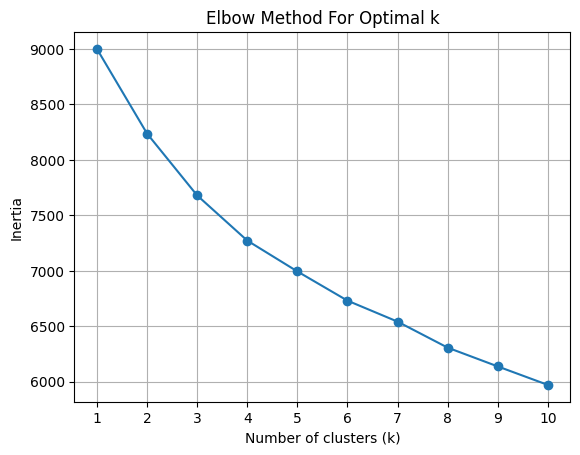

In [ ]:
inertia = []

k_values = range(1, 11)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# elbow curve
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.grid(True)
plt.show()

In [ ]:
df2 = pd.DataFrame(X_scaled, columns=X.columns)

In [ ]:
df2.head()

,Age,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Alcohol_Consumption_per_Week
0,0.339295,-0.739268,-0.167133,-1.025919,-0.807759,0.950162,0.859340,1.073119,0.851256
1,1.057320,-1.289677,-0.117272,0.383310,-1.029806,-1.354828,0.909042,-0.472706,0.851256
2,-0.213033,-1.152075,-0.964902,1.045752,-0.868594,-1.467266,-0.532304,-0.648368,-1.603952
3,-0.986291,1.531169,0.132031,1.415470,0.048490,-1.579705,1.555162,1.213648,0.149768
4,0.560226,-1.220876,-1.064623,1.219034,0.348101,-1.017512,1.306654,1.213648,1.202000


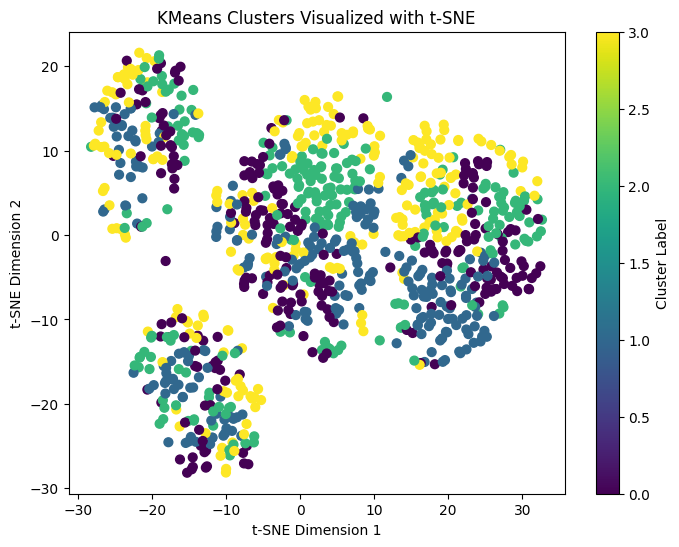

In [ ]:
# fit KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
k_labels = kmeans.fit_predict(X_scaled)

# tsne visualization
tsne = TSNE(n_components=2, perplexity=50, random_state=77)
X_tsne = tsne.fit_transform(dfscaled)

# plot
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=k_labels, cmap='viridis', s=40)
plt.title("KMeans Clusters Visualized with t-SNE")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.colorbar(label='Cluster Label')
plt.show()

In [ ]:
score = silhouette_score(X_scaled, k_labels)
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: 0.081


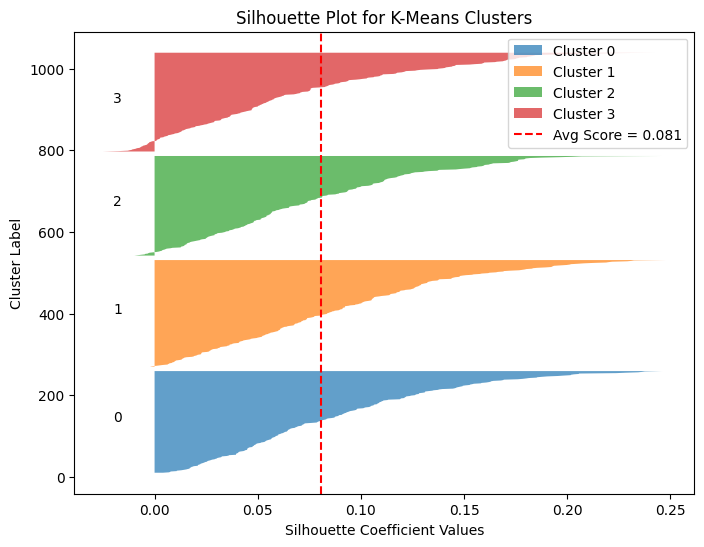

In [ ]:
silhouette_vals = silhouette_samples(X_scaled, k_labels)
avg_score = silhouette_score(X_scaled, k_labels)
clusters = k_labels
k = len(np.unique(k_labels))
fig, ax = plt.subplots(figsize=(8, 6))
y_lower = 10
for i in range(k):
    icv = silhouette_vals[clusters == i]
    icv.sort()
    size_cluster_i = icv.shape[0]
    y_upper = y_lower + size_cluster_i

    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, icv, alpha=0.7, label=f"Cluster {i}"
    )
    ax.text(-0.02, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10
ax.axvline(avg_score, color="red", linestyle="--", label=f"Avg Score = {avg_score:.3f}")
ax.set_xlabel("Silhouette Coefficient Values")
ax.set_ylabel("Cluster Label")
ax.set_title("Silhouette Plot for K-Means Clusters")
ax.legend(loc="upper right")
plt.show()

In [ ]:
true_labels = df['Heart_Disease'].replace({'Yes': 1, 'No': 0}).to_numpy()
ari_score = adjusted_rand_score(true_labels, k_labels)

<ipython-input-161-3f85616b4722>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  true_labels = df['Heart_Disease'].replace({'Yes': 1, 'No': 0}).to_numpy()


In [ ]:
print(f"Adjusted Rand Index (ARI): {ari_score:.4f}")

Adjusted Rand Index (ARI): 0.0002


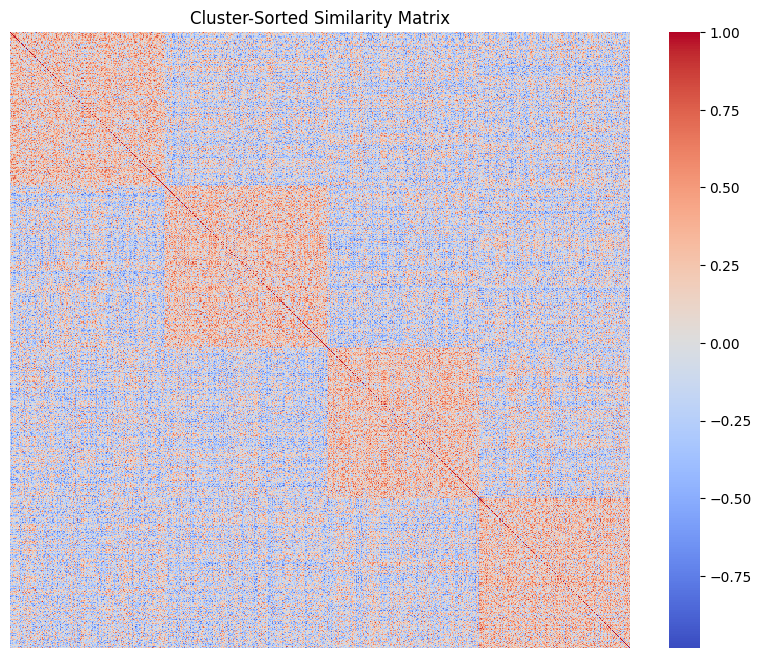

In [ ]:
similarity_matrix = cosine_similarity(X_scaled)

sorted_indices = np.argsort(k_labels)
sorted_matrix = similarity_matrix[sorted_indices][:, sorted_indices]

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_matrix, cmap='coolwarm', xticklabels=False, yticklabels=False)
plt.title('Cluster-Sorted Similarity Matrix')
plt.show()

In [ ]:
df_cat['Cluster'] = k_labels
df_num['Cluster'] = k_labels

<ipython-input-114-c94746df9884>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat['Cluster'] = k_labels


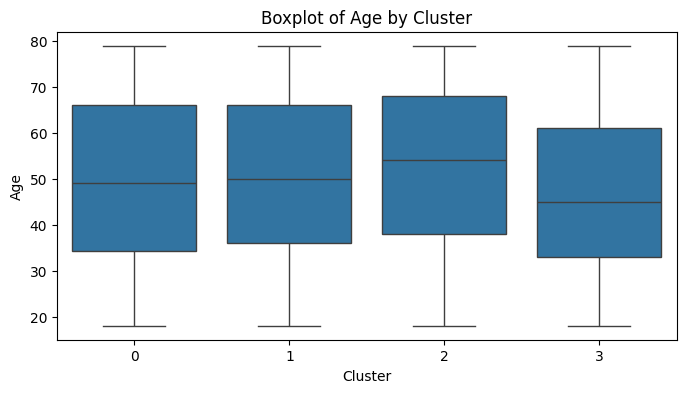

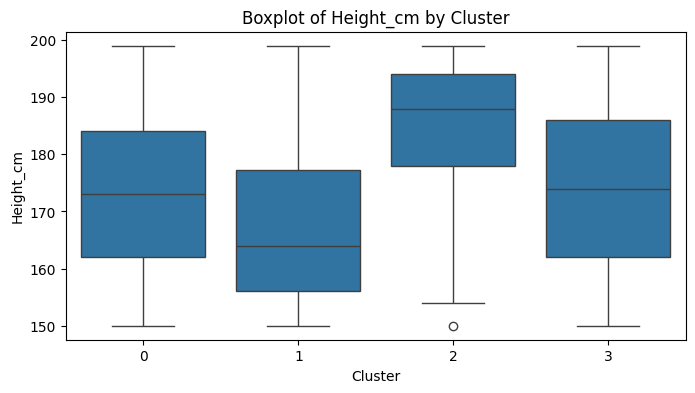

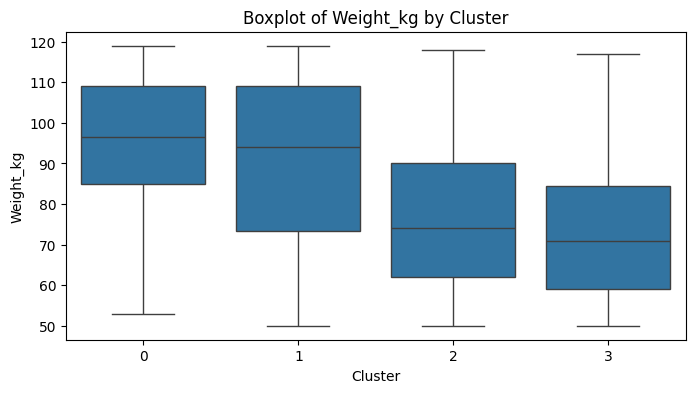

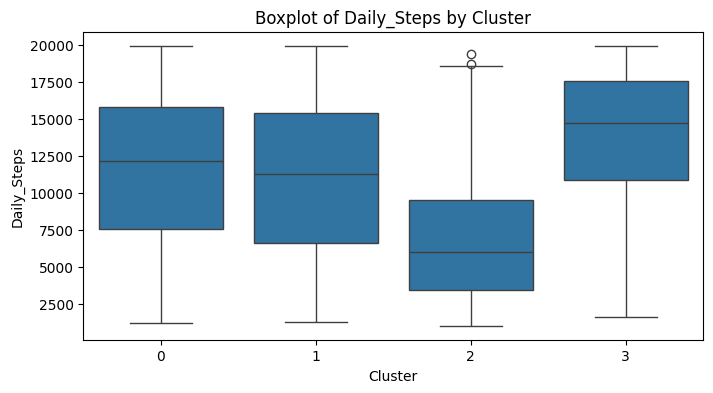

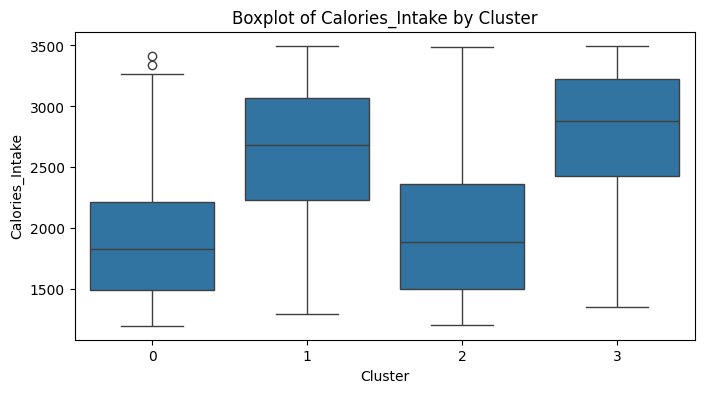

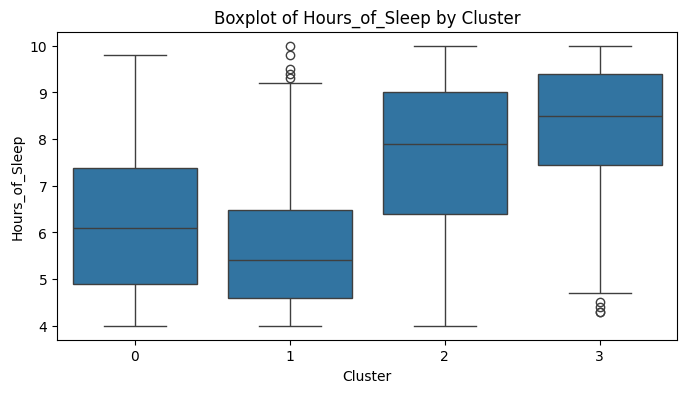

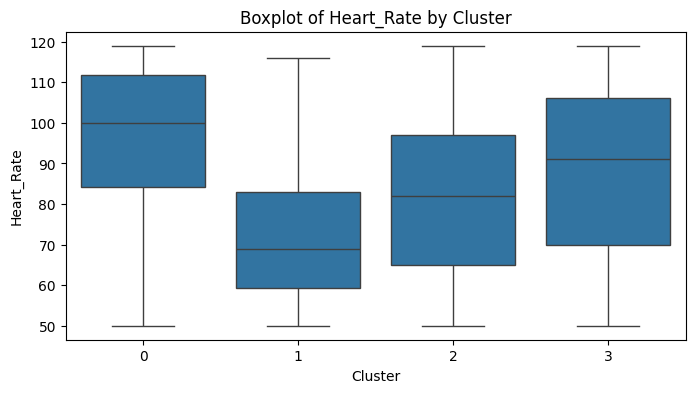

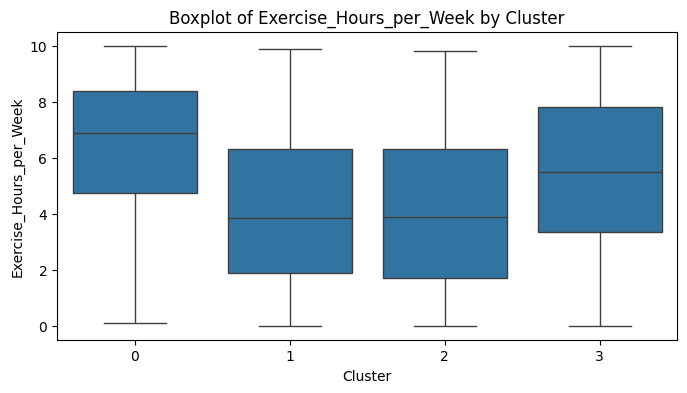

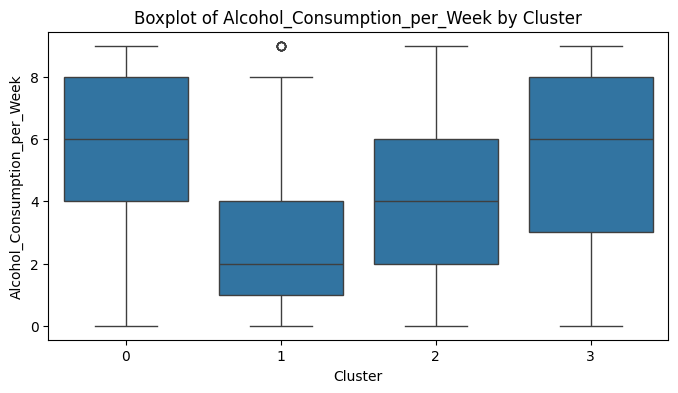

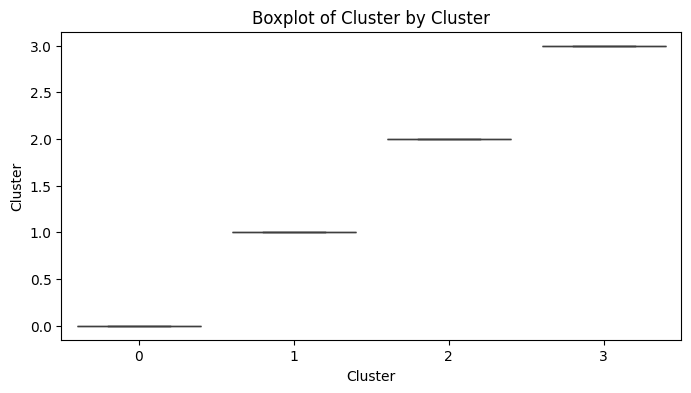

In [ ]:
for col in df_num.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='Cluster', y=col, data=df_num)
    plt.title(f'Boxplot of {col} by Cluster')
    plt.show()

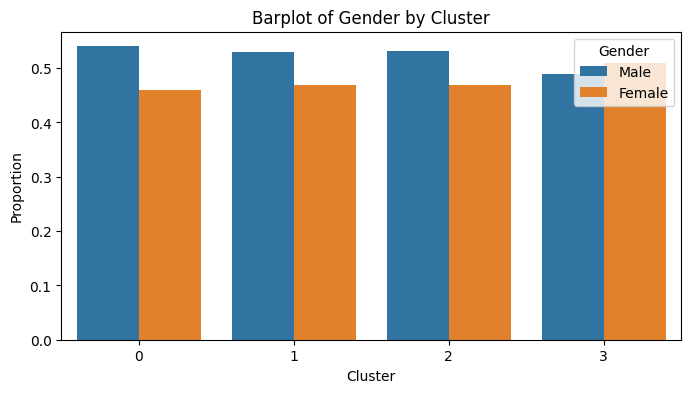

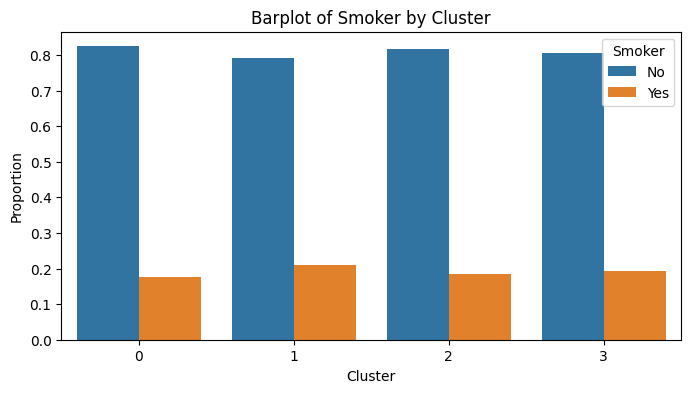

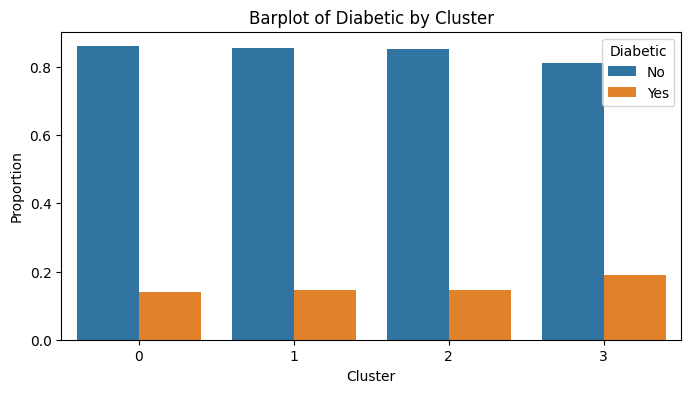

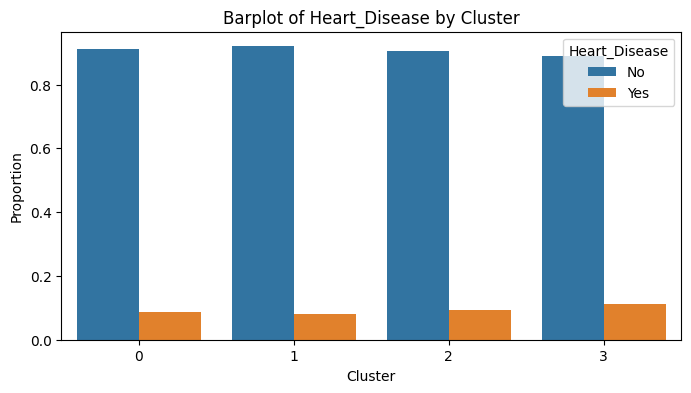

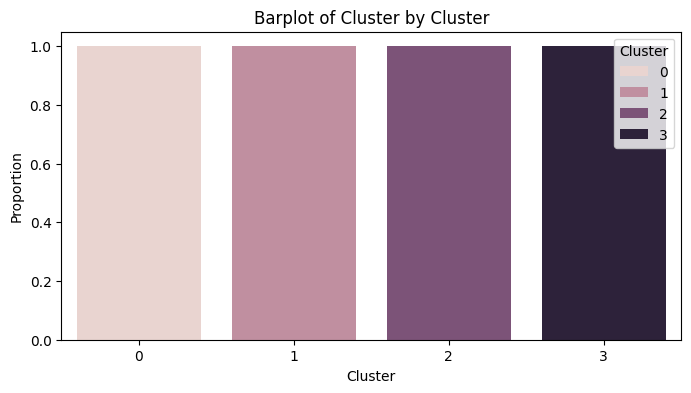

In [ ]:
for col in df_cat.columns:
    plt.figure(figsize=(8, 4))
    prop_df = (df_cat.groupby('Cluster')[col].value_counts(normalize=True)
               .rename('Proportion')
               .reset_index())
    sns.barplot(x='Cluster', y='Proportion', hue=col, data=prop_df)
    plt.title(f'Barplot of {col} by Cluster')
    plt.show()

## 9. Clustering Algorithm #2 (K-Prototype)

We selected K-Prototypes with n_clusters=4, based on the same two methods - the elbow method and visual inspection of the t-SNE plot. Additionally, we wanted to compare these similar algorithms with the same number of clusters selected to better compare them fairly. The elbow plot showed a clear leveling off starting at k=4. The t-SNE plot showed four relatively distinct cluster regions in the wave-like formation, though not as well-separated. I clustered the dataset using K-Prototypes with n_clusters=4 and a fixed random_state=42 to ensure reproducibility.
The results were visualized using a t-SNE plot, color-coded by the assigned cluster labels. Unlike KMeans, which showed overlap, K-Prototypes resulted in more clearly partitioned groups, suggesting that incorporating categorical features led to more meaningful splits in this dataset. Compared to KMeans, the cluster boundaries were less defined, reflecting the mixed nature of the data suggesting that there was difficulty making clear distinctions at the boundaries based on the additional categorical data. However, the groupings were much better in terms of grouping similarly clustered observations together, suggesting that the categorical data played an important role and is truly significant in terms of clustering. This supports the research motivation of exploring natural groupings across various attributes and specifically in this case with categorical consideration.

The similarity matrix revealed four distinct diagonal blocks with strong intra-cluster cohesion. Cluster 1 and Cluster 2 show especially high internal similarity. There is very little off-diagonal mix, which suggests strongly that clusters are well-separated and coherent in the mixed space. Cluster 1 also seemed to have slightly more variability but still indicated reasonable separation due to the spread and slight split across the center. The average silhouette score using Gower distance was 0.125. While lower than the Euclidean-based silhouette (which was 0.515), the Gower result is a more appropriate evaluation of clustering quality for K-Prototypes, as it accurately accounts for both numeric and categorical attributes.

Both the silhouette and similarity matrix may inadequately capture quality in a mixed-type setting. These tools are based on distance metrics that may under-represent categorical attribute contributions, even with adjusted weighting and using metrics like Gowers for distance. It is therefore important to note this and be wary when interpreting cohesiveness and separation for K-Prototypes compared to continuous, numerical methods.

There is evidence that Cluster 0 may have split an inherent group. On the t-SNE plot, there is a relatively large spread of points near the boundary of Cluster 0 and 1 which could suggest that a group may have been divided.
Cluster 3 contains two visually distinct regions on the t-SNE plot (at the border with Cluster 2 and the larger group towards the bottom right), suggesting that it may have merged two or more natural subgroups.



*   Cluster 0: Low levels of physical activity, with the lowest average daily step count (ranging around 3,500 to 5,000) and lower weekly exercise hours. These individuals also report fewer hours of sleep and have slightly elevated BMI indices. Their caloric intake and alcohol consumption are moderate, and they have roughly equal distribution in terms of gender. However, this cluster shows a somewhat higher proportion of smokers and a greater prevalence of heart disease compared to the others. Overall, this cluster likely represents a more sedentary or at-risk group with limited physical engagement and slightly elevated health risks.
*   Cluster 1: Low physical activity (though slightly more than Cluster 0) with lower daily steps and fewer exercise hours per week. Their BMI values are moderately high and they have shorter sleep durations on average. Alcohol consumption is relatively low, and they maintain average caloric intake. Categorically, this cluster shows the lowest prevalence of smoking and second lowest of heart disease, with a slight male majority. This group may represent a more inactive but also cautious lifestyle - for example potentially people who don’t engage in harmful behaviors but also lack strong physical activity habits.
*   Cluster 2: Moderate to high levels of physical activity, averaging between 12,000 and 15,000 daily steps and a solid number of weekly exercise hours. These individuals maintain a balanced health profile, with moderate BMI, typical sleep hours, and average caloric and alcohol intake. Categorical analysis shows they are mostly non-smokers, with low rates of diabetes, and a noticeable male skew. This group appears to be an active, generally healthy male-leaning population with consistent lifestyle habits. However, this cluster does have a high heart disease prevalence, suggesting that despite the healthy activity, there is something else contributing to this high rate, possibly the male skewed population or even the idea that it may be a prescribed exercise/health regime for people already prone to/at risk of heart disease.
*   Cluster 3: This is the most physically active group, with the highest average daily steps (between 18,000 and 20,000) and the most weekly exercise hours. They also maintain consistent sleep schedules and have slightly lower BMI. Caloric intake is high, and alcohol consumption is relatively elevated compared to other clusters. This group shows very low smoking rates, although diabetes prevalence is slightly higher than in other clusters. Overall, Cluster 3 appears to represent a highly active, health-conscious, and wellness-oriented population.

In [ ]:
# k-prototype
#encode categorical variables
df_cat_enc = df_cat.apply(lambda col: col.astype('category').cat.codes)

df_num_clean = df_num.drop(columns=["Cluster", "KProto_Cluster"])
df_cat_enc_clean = df_cat_enc.drop(columns=["Cluster"])
X = np.hstack([df_num_clean.values, df_cat_enc_clean.values])

# X = np.hstack([df_num.values, df_cat_enc.values.reshape(-1, df_cat_enc.shape[1])])
cat_cols = list(range(df_num.shape[1], X.shape[1]))

In [ ]:
k = 4
kproto = KPrototypes(n_clusters=k, init='Huang', n_init=5, verbose=1, random_state=42)
clusters = kproto.fit_predict(X, categorical=cat_cols)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 238, ncost: 2703033839.4883246
Run: 1, iteration: 2/100, moves: 128, ncost: 2416836482.427576
Run: 1, iteration: 3/100, moves: 39, ncost: 2388564768.752773
Run: 1, iteration: 4/100, moves: 26, ncost: 2367527868.5228186
Run: 1, iteration: 5/100, moves: 24, ncost: 2349695587.33209
Run: 1, iteration: 6/100, moves: 20, ncost: 2338557842.833955
Run: 1, iteration: 7/100, moves: 9, ncost: 2335947497.673469
Run: 1, iteration: 8/100, moves: 13, ncost: 2330495229.487079
Run: 1, iteration: 9/100, moves: 16, ncost: 2324320497.4374704
Run: 1, iteration: 10/100, moves: 8, ncost: 2322412806.5331025
Run: 1, iteration: 11/100, moves: 3, ncost: 2321774271.433847
Run: 1, iteration: 12/100, moves: 9, ncost: 2318716393.385059
Run: 1, iteration: 13/100, moves: 5, ncost: 2317693658.028872
Run: 1, iteration: 14/100, moves: 4, ncost: 2316896008.067164
Run: 1, iteration: 15/100, moves: 4, ncost: 2316

In [ ]:
df_num['KProto_Cluster'] = clusters.astype(str)
df_num.head()

,Age,Height_cm,Weight_kg,Daily_Steps,Calories_Intake,Hours_of_Sleep,Heart_Rate,Exercise_Hours_per_Week,Alcohol_Consumption_per_Week,Cluster,KProto_Cluster
0,56,164,81,5134,1796,8.6,102,8.1,7,0,2
1,69,156,82,12803,1650,4.5,103,3.7,7,0,0
2,46,158,65,16408,1756,4.3,74,3.2,0,1,3
3,32,197,87,18420,2359,4.1,116,8.5,5,0,3
4,60,157,63,17351,2556,5.1,111,8.5,8,0,3


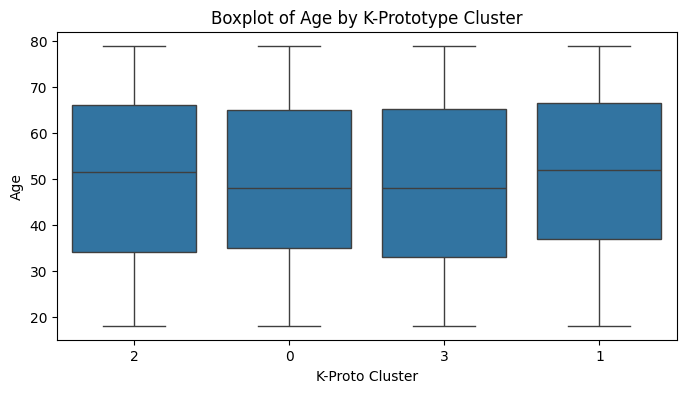

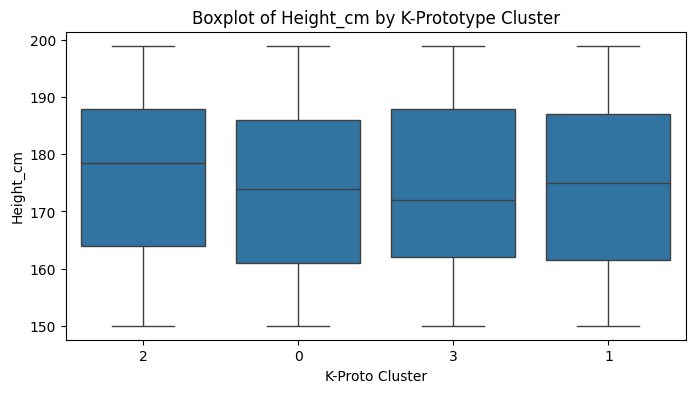

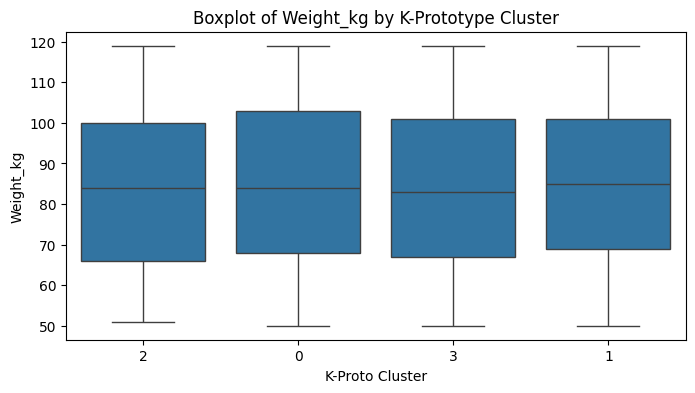

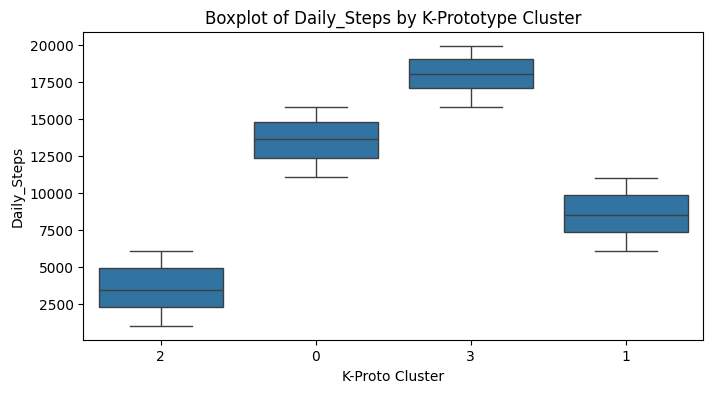

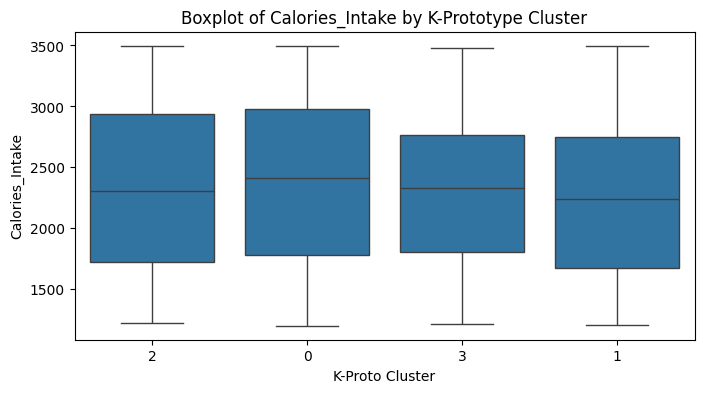

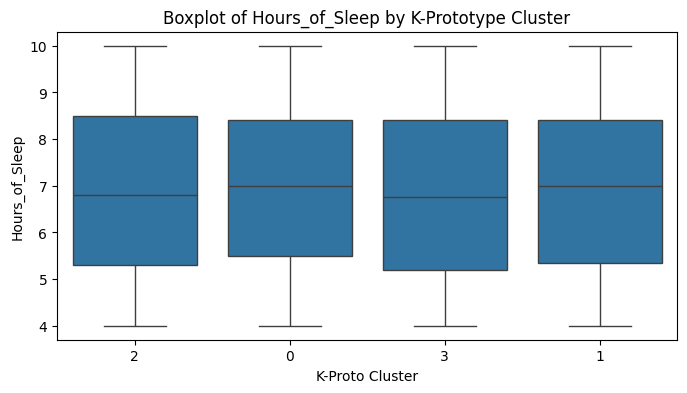

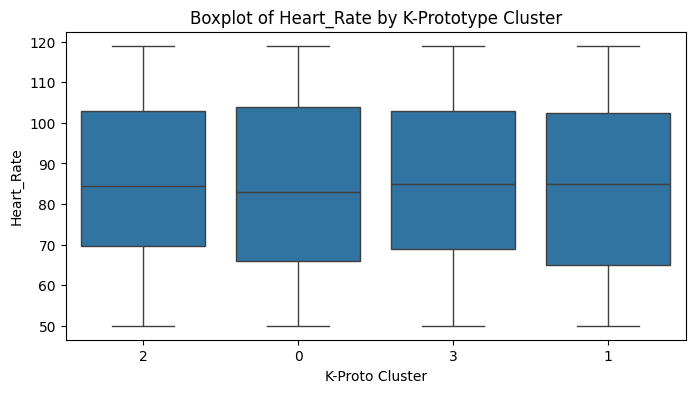

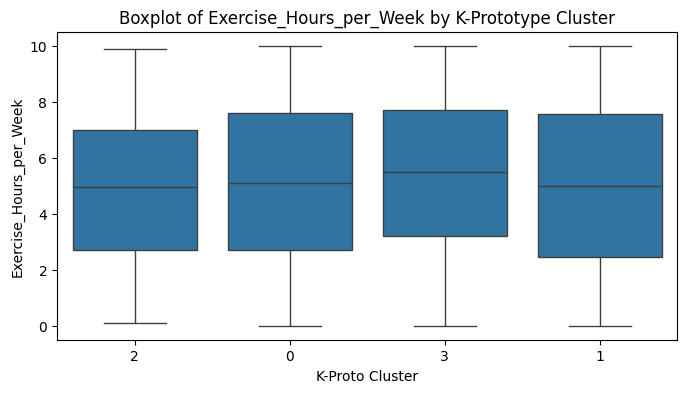

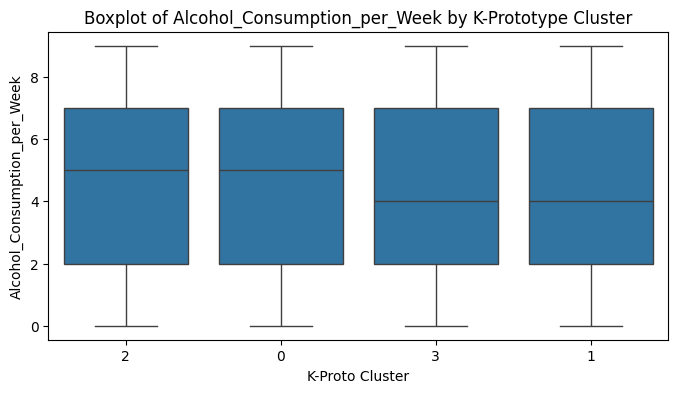

In [ ]:
numeric_feats = [c for c in df_num.columns if c not in ['Cluster','KProto_Cluster']]
for feat in numeric_feats:
    plt.figure(figsize=(8,4))
    sns.boxplot(x='KProto_Cluster', y=feat, data=df_num)
    plt.title(f'Boxplot of {feat} by K-Prototype Cluster')
    plt.xlabel('K-Proto Cluster')
    plt.ylabel(feat)
    plt.show()

<ipython-input-152-ebb449f20ff6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat['KProto_Cluster'] = df_num['KProto_Cluster']


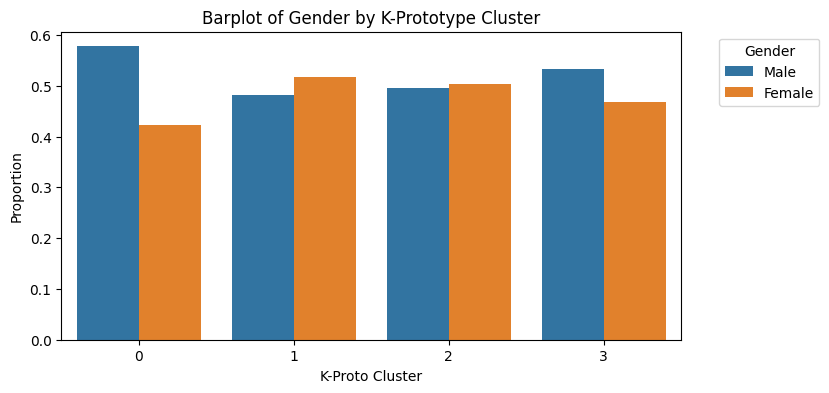

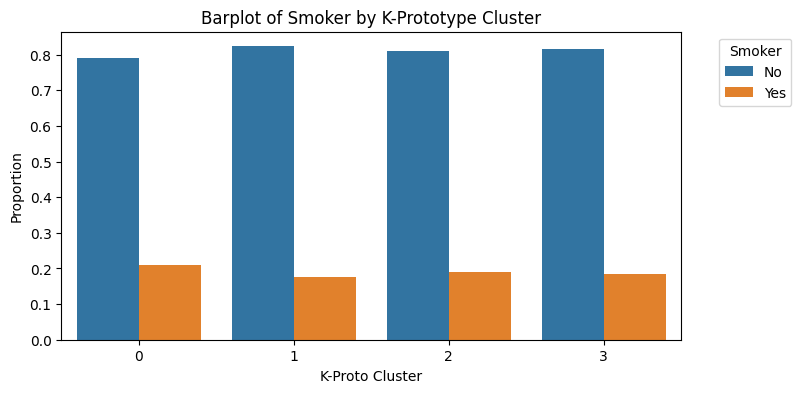

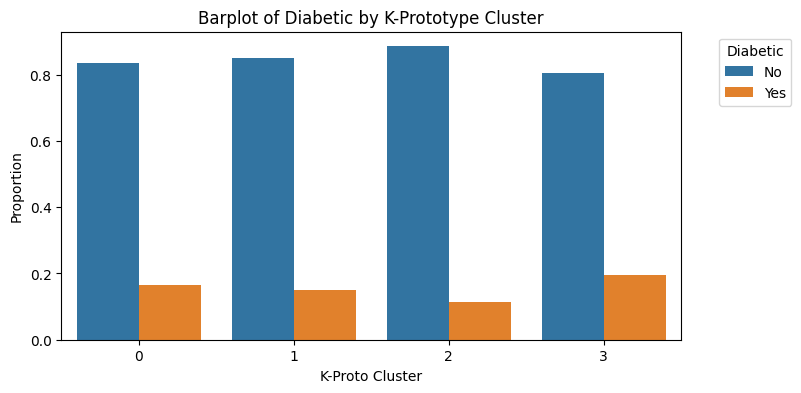

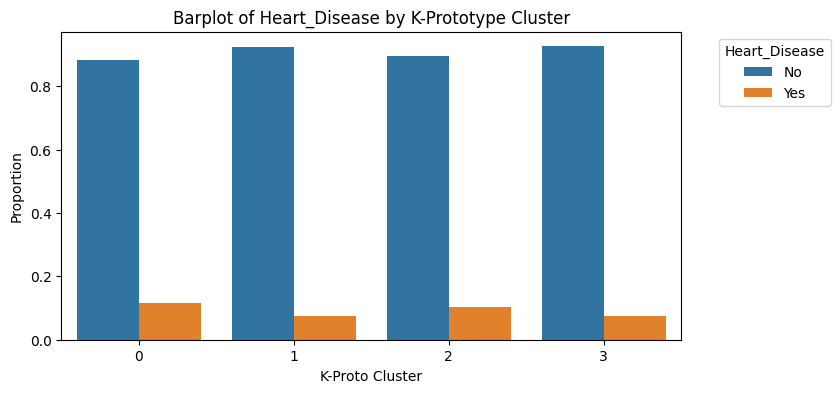

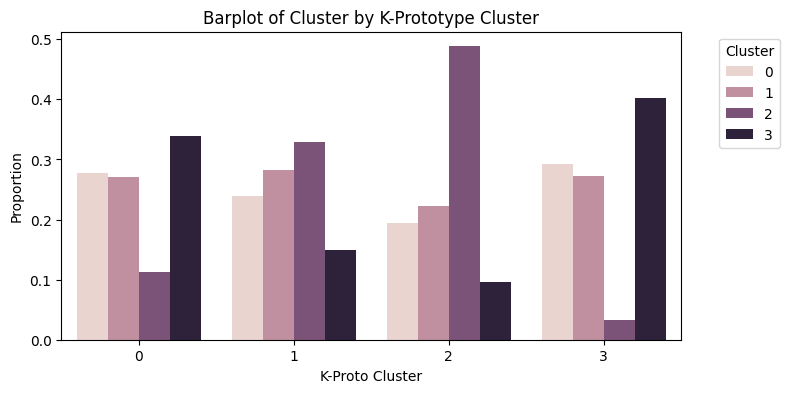

In [ ]:
df_cat['KProto_Cluster'] = df_num['KProto_Cluster']
for feat in df_cat.columns.drop('KProto_Cluster'):
    plt.figure(figsize=(8,4))
    prop_df = (df_cat.groupby('KProto_Cluster')[feat].value_counts(normalize=True).rename('Proportion').reset_index())
    sns.barplot(x='KProto_Cluster', y='Proportion', hue=feat, data=prop_df)
    plt.title(f'Barplot of {feat} by K-Prototype Cluster')
    plt.xlabel('K-Proto Cluster')
    plt.ylabel('Proportion')
    plt.legend(title=feat, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.show()

In [ ]:
score = silhouette_score(X, clusters.astype(int), metric='euclidean')
score

np.float64(0.5146581734199205)

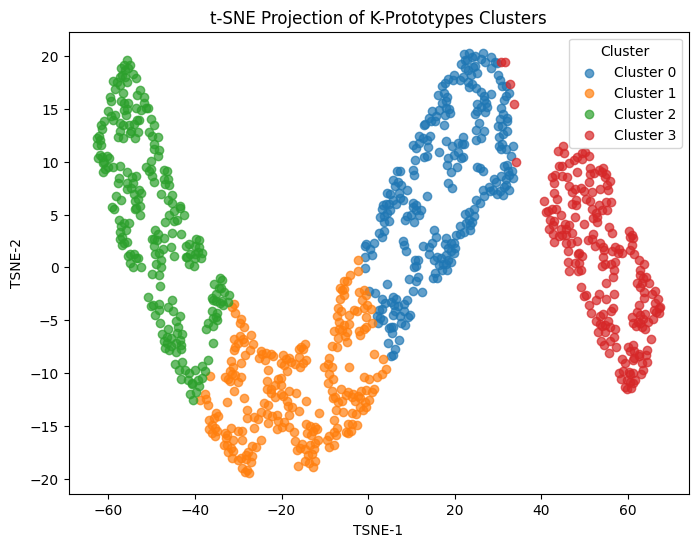

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_embedded = tsne.fit_transform(X)

plt.figure(figsize=(8, 6))
for label in np.unique(clusters):
    idx = clusters == label
    plt.scatter(X_embedded[idx, 0], X_embedded[idx, 1], label=f"Cluster {label}", alpha=0.7)
plt.legend(title="Cluster")
plt.title("t-SNE Projection of K-Prototypes Clusters")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.show()

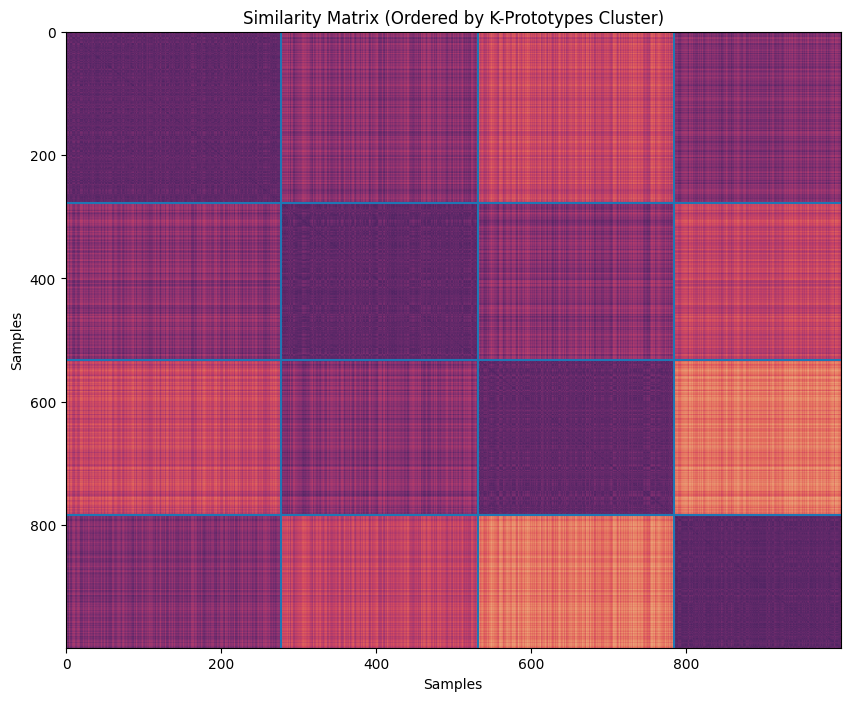

In [ ]:
order = np.argsort(clusters)
clusters_ord = clusters[order]

dist = pairwise_distances(X[order], metric='euclidean')
sim = 1 - (dist / dist.max())
plt.figure(figsize=(10, 8))
plt.imshow(sim, aspect='auto', cmap='flare')
plt.title('Similarity Matrix (Ordered by K-Prototypes Cluster)')
plt.xlabel('Samples')
plt.ylabel('Samples')
labels, counts = np.unique(clusters_ord, return_counts=True)
bounds = np.cumsum(counts)
for b in bounds[:-1]:
    plt.axhline(b)
    plt.axvline(b)

plt.show()

In [ ]:
gower_dist_matrix = gower.gower_matrix(X)
silhouette_vals = silhouette_samples(gower_dist_matrix, clusters, metric='precomputed')
avg_score = silhouette_score(gower_dist_matrix, clusters, metric='precomputed')
print(f"Average Silhouette Score (Gower): ", avg_score)

Average Silhouette Score (Gower):  0.124959715


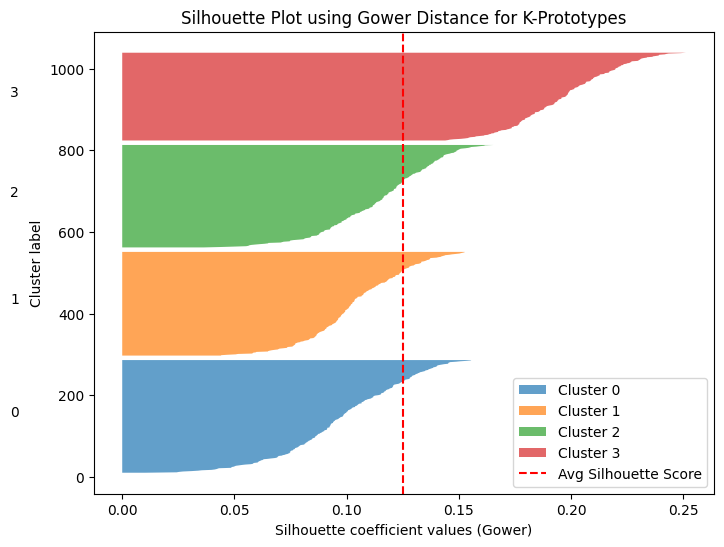

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
y_lower = 10
for i in range(k):
    icv = silhouette_vals[clusters == i]
    icv.sort()
    size_cluster_i = icv.shape[0]
    y_upper = y_lower + size_cluster_i

    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, icv, alpha=0.7, label=f"Cluster {i}")
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax.axvline(avg_score, color="red", linestyle="--", label="Avg Silhouette Score")
ax.set_xlabel("Silhouette coefficient values (Gower)")
ax.set_ylabel("Cluster label")
ax.set_title("Silhouette Plot using Gower Distance for K-Prototypes")
ax.legend()
plt.show()

In [ ]:
ari_score = adjusted_rand_score(true_labels, clusters)
print("Adjusted Rand Index (ARI):", ari_score)

Adjusted Rand Index (ARI): -0.0012887100728961331


## 10. Discussion

The results of the two clustering algorithms, KMeans and K-Prototypes, were meaningfully different in both structure and interpretability. The Adjusted Rand Index (ARI) for the KMeans and K-Prototypes clusterings were both which indicates low agreement between the two clustering algorithm splits and the true labels. It may have been the case that the clusters captured broader lifestyle and demographic patterns beyond just disease presence. While KMeans relied purely on numeric attributes and resulted in clusters with high visual overlap (low silhouette score of 0.081), K-Prototypes used both numeric and categorical features which led to more distinct and interpretable groupings (silhouette score using Gower distance: 0.125). Also, the t-SNE plots revealed that KMeans clusters showed fuzzier boundaries and much greater overlap, whereas K-Prototypes created cleaner divisions that were better aligned with categorical traits like smoking/non-smoking, diabetes, exercise, etc. For example, KMeans merged high-exercise and high-alcohol individuals into a single group, whereas K-Prototypes separated them more clearly based on categorical risk markers.

K-Prototypes demonstrated a better ability to identify the inherent clusters in this mixed-type dataset. This is supported by visual evidence and metrics. K-Prototypes clusters were more closely aligned with health-related categorical labels (smoker/non-smoker, diabetic/non-diabetic, etc.), indicating that they much better captured these groupings which have real-world basis. It is much more likely that people who are more active, have less bad habits, etc, will have a lower risk of heart disease than those who don’t. Additionally, while KMeans tended to group by numerical closeness, K-Prototypes used categorical values as well to create groupings that were more coherent, as visually evident. This was especially pronounced in clusters that separated healthy individuals with balanced habits from those with elevated health risks.

K-Prototypes is more trustworthy for this specific dataset because it respects the structure of mixed-type data. The silhouette score was also expectedly higher for K-Prototypes (Gower distance). In contrast, KMeans likely overfit numeric values and failed to capture important categorical distinctions which only K-Prototypes was able to do. K-Prototypes produced clusters that better matched health conditions ( diabetes, smoking, etc), which are crucial for public health interpretation and were not easily interpretable as part of K-Means. Therefore, its clusters are more useful for designing actionable health diagnoses and plans.

In terms of something that K-means discovered that K-Prototypes couldn't necessarily, is that K-Means highlights clusters driven purely by numeric features. For example, a distinct active group based solely on step counts and exercise hours. K-Prototypes, on the other hand, by balancing categorical variables as well, in a way hid these clear continuous separations.


Again, KMeans revealed general patterns tied to numerical groupings, such as clusters formed around high caloric intake or frequent exercise. These insights were useful in understanding these continuous raw value-based differences but failed to reveal strong categorical associations which are equally - if not more - important. On the other hand, K-Prototypes offered insights that KMeans was unable to. Specifically, it separated subgroups defined by categorical risk markers which obviously helps in identifying medically relevant behavioral profiles. For example, K-Prototypes found a health-conscious yet high-risk group (Cluster 2) that KMeans failed to isolate due to lack of categorical awareness which allowed us to draw a reasonable conclusion that that group may be a potentially monitored/active treatment group with specific diet, exercise, behavior regimine advice from their doctors.

The analysis confirms that clustering methods for health datasets should be carefully chosen to reflect the data's mixed structure. Numeric-only algorithms like KMeans can offer broader insights but may (and did) miss more specific and relevant associations in the health space. Mixed clustering like K-Prototypes is better for medical applications, especially with key categorical variables. This supports our research motivation of improving health outcome predictions and clustering group discovery for treatment/health improvement planning.

## 11. Conclusion

In this report, we analyzed a health and lifestyle dataset using clustering techniques (KMeans and K-Prototypes) to uncover patterns in behaviors and health risks. After data cleaning, scaling, and outlier detection using KNN distance plots, we identified four meaningful clusters supported by t-SNE visualizations and evaluation metrics. K-Prototypes, which handled both numeric and categorical data, produced clearer, more interpretable groupings aligned with real-world health indicators like smoking and heart disease. We recommend public health officials use these insights to identify at-risk groups and guide targeted interventions. However, limitations include missing variables (e.g., mental health, socioeconomic status) and reliance on heuristics like t-SNE. Future work should expand the dataset, explore advanced clustering and develop tools for interactive exploration and personalized feedback.

## References

* American Psychological Association. (2010). Making lifestyle changes that last. American Psychological Association. https://www.apa.org/topics/behavioral-health/healthy-lifestyle-changes

* Centers for Disease Control and Prevention. (2023, December 22). Lifestyle risk factors. Centers for Disease Control and Prevention. https://www.cdc.gov/environmental-health-tracking/php/data-research/lifestyle-risk-factors.html

* Yale School of Public Health. (2025, February 19).  Lifestyle factors that impact public health. https://ysph.yale.edu/public-health-research-and-practice/interdepartmental-foci/lifestyle-factors/

* https://www.kaggle.com/datasets/mahdimashayekhi/health-and-lifestyle-dataset?resource=download